In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
dataset = pd.read_csv(r"/content/drive/MyDrive/UNR-IDD.csv")

dataset.head(4)

,Switch ID,Port Number,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,...,Unknown Load/Latest,Latest bytes counter,is_valid,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size,Label,Binary Label
0,of:000000000000000c,Port#:1,132,9181,6311853,238,46,0,0,0,...,0,0,True,0,9,767,688,-1,TCP-SYN,Attack
1,of:000000000000000c,Port#:2,187,6304498,15713,171,46,0,0,0,...,0,0,True,0,9,767,688,-1,TCP-SYN,Attack
2,of:000000000000000c,Port#:3,235,6311567,8030,58,46,0,0,0,...,0,0,True,0,9,767,688,-1,TCP-SYN,Attack
3,of:000000000000000c,Port#:4,59,7878,16439,182,46,0,0,0,...,0,0,True,0,9,767,688,-1,TCP-SYN,Attack


In [4]:
dataset.shape

(37411, 34)

array([[<Axes: title={'center': 'Received Packets'}>,
        <Axes: title={'center': 'Received Bytes'}>,
        <Axes: title={'center': 'Sent Bytes'}>,
        <Axes: title={'center': 'Sent Packets'}>,
        <Axes: title={'center': 'Port alive Duration (S)'}>],
       [<Axes: title={'center': 'Packets Rx Dropped'}>,
        <Axes: title={'center': 'Packets Tx Dropped'}>,
        <Axes: title={'center': 'Packets Rx Errors'}>,
        <Axes: title={'center': 'Packets Tx Errors'}>,
        <Axes: title={'center': 'Delta Received Packets'}>],
       [<Axes: title={'center': 'Delta Received Bytes'}>,
        <Axes: title={'center': 'Delta Sent Bytes'}>,
        <Axes: title={'center': 'Delta Sent Packets'}>,
        <Axes: title={'center': 'Delta Port alive Duration (S)'}>,
        <Axes: title={'center': 'Delta Packets Rx Dropped'}>],
       [<Axes: title={'center': ' Delta Packets Tx Dropped'}>,
        <Axes: title={'center': 'Delta Packets Rx Errors'}>,
        <Axes: title={'center

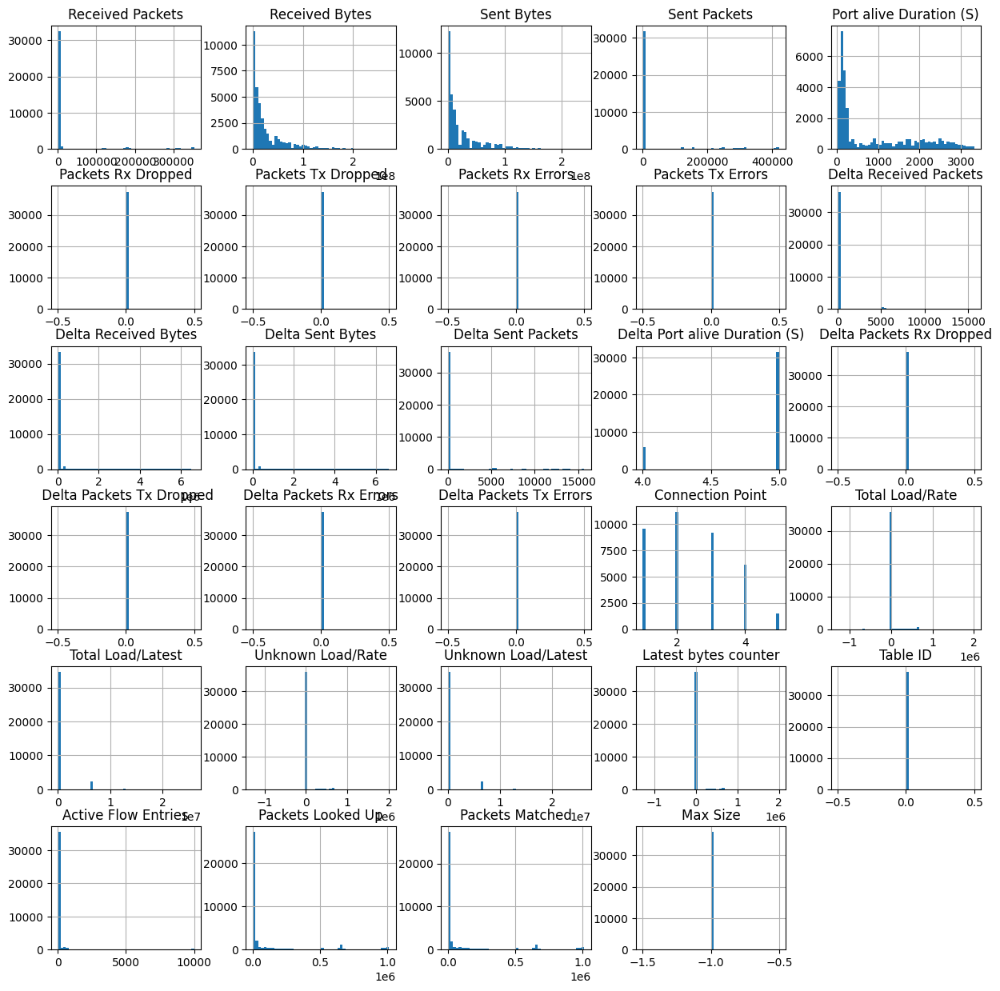

In [9]:
dataset.hist(bins = 50,figsize = (15,15))

In [13]:
print (dataset['Label'].unique())

['TCP-SYN' 'Blackhole' 'Diversion' 'Overflow' 'Normal' 'PortScan']


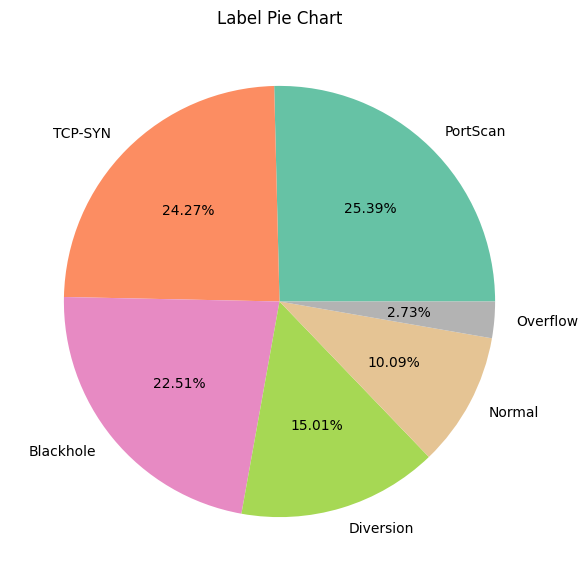

In [17]:

dataset['Label'].value_counts().plot(kind='pie', autopct='%1.2f%%', figsize=(7, 7), cmap='Set2')

plt.title("Label Pie Chart")
plt.ylabel('')
plt.show()


In [18]:
print (dataset['Binary Label'].unique())

['Attack' 'Normal']


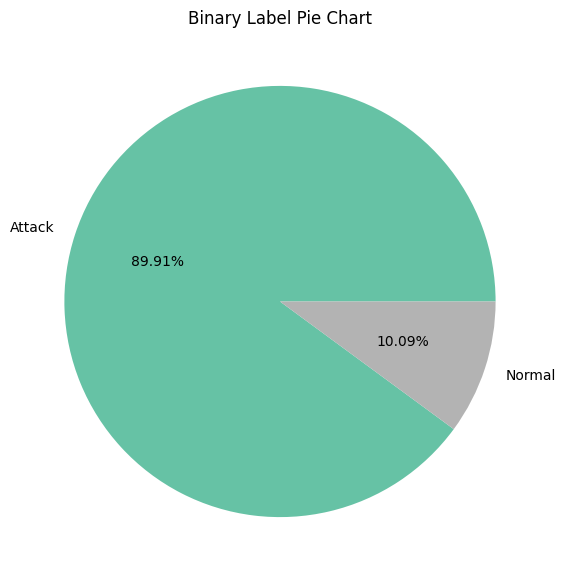

In [19]:
dataset['Binary Label'].value_counts().plot(kind='pie', autopct='%1.2f%%', figsize=(7, 7), cmap='Set2')

plt.title("Binary Label Pie Chart")
plt.ylabel('')
plt.show()

In [20]:
print (dataset['Switch ID'].unique())

['of:000000000000000c' 'of:000000000000000a' 'of:000000000000000b'
 'of:0000000000000003' 'of:0000000000000004' 'of:0000000000000001'
 'of:0000000000000002' 'of:0000000000000007' 'of:0000000000000008'
 'of:0000000000000005' 'of:0000000000000006' 'of:0000000000000009']


In [21]:
print (dataset['Port Number'].unique())

['Port#:1' 'Port#:2' 'Port#:3' 'Port#:4']


In [22]:
print (dataset['is_valid'].unique())

[ True]


In [23]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37411 entries, 0 to 37410
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Switch ID                      37411 non-null  object
 1   Port Number                    37411 non-null  object
 2   Received Packets               37411 non-null  int64 
 3   Received Bytes                 37411 non-null  int64 
 4   Sent Bytes                     37411 non-null  int64 
 5   Sent Packets                   37411 non-null  int64 
 6   Port alive Duration (S)        37411 non-null  int64 
 7   Packets Rx Dropped             37411 non-null  int64 
 8   Packets Tx Dropped             37411 non-null  int64 
 9   Packets Rx Errors              37411 non-null  int64 
 10  Packets Tx Errors              37411 non-null  int64 
 11  Delta Received Packets         37411 non-null  int64 
 12  Delta Received Bytes           37411 non-null  int64 
 13  D

In [24]:
dataset['Label'].value_counts()

,count
Label,
PortScan,9500
TCP-SYN,9081
Blackhole,8420
Diversion,5615
Normal,3773
Overflow,1022


In [25]:
dataset['Binary Label'].value_counts()

,count
Binary Label,
Attack,33638
Normal,3773


In [26]:
dataset.drop(['is_valid'], axis=1, inplace=True)
dataset.drop(['Switch ID'], axis=1, inplace=True)
dataset.drop(['Port Number'], axis=1, inplace=True)


In [27]:
dataset.head(3)

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,Packets Tx Errors,Delta Received Packets,...,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size,Label,Binary Label
0,132,9181,6311853,238,46,0,0,0,0,0,...,0,0,0,0,9,767,688,-1,TCP-SYN,Attack
1,187,6304498,15713,171,46,0,0,0,0,146,...,0,0,0,0,9,767,688,-1,TCP-SYN,Attack
2,235,6311567,8030,58,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,TCP-SYN,Attack


In [28]:
print(dataset.columns)


Index(['Received Packets', 'Received Bytes', 'Sent Bytes', 'Sent Packets',
       'Port alive Duration (S)', 'Packets Rx Dropped', 'Packets Tx Dropped',
       'Packets Rx Errors', 'Packets Tx Errors', 'Delta Received Packets',
       'Delta Received Bytes', 'Delta Sent Bytes', 'Delta Sent Packets',
       'Delta Port alive Duration (S)', 'Delta Packets Rx Dropped',
       ' Delta Packets Tx Dropped', 'Delta Packets Rx Errors',
       'Delta Packets Tx Errors', 'Connection Point', 'Total Load/Rate',
       'Total Load/Latest', 'Unknown Load/Rate', 'Unknown Load/Latest',
       'Latest bytes counter', 'Table ID', 'Active Flow Entries',
       'Packets Looked Up', 'Packets Matched', 'Max Size', 'Label',
       'Binary Label'],
      dtype='object')


In [29]:
pd.DataFrame(dataset)

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,Packets Tx Errors,Delta Received Packets,...,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size,Label,Binary Label
0,132,9181,6311853,238,46,0,0,0,0,0,...,0,0,0,0,9,767,688,-1,TCP-SYN,Attack
1,187,6304498,15713,171,46,0,0,0,0,146,...,0,0,0,0,9,767,688,-1,TCP-SYN,Attack
2,235,6311567,8030,58,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,TCP-SYN,Attack
3,59,7878,16439,182,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,TCP-SYN,Attack
4,188,6304547,16497,183,46,0,0,0,0,0,...,0,0,0,0,7,489,403,-1,TCP-SYN,Attack
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37406,228,30195,7857046,145141,276,0,0,0,0,4,...,0,0,0,0,6,147563,147454,-1,PortScan,Attack
37407,1064,18962056,37732,338,276,0,0,0,0,4,...,0,0,0,0,6,147563,147454,-1,PortScan,Attack
37408,1042,25252012,7856976,145140,276,0,0,0,0,4,...,0,0,0,0,8,295511,295404,-1,PortScan,Attack
37409,149012,14360115,29509,211,276,0,0,0,0,5381,...,0,0,0,0,8,295511,295404,-1,PortScan,Attack


In [30]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37411 entries, 0 to 37410
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Received Packets               37411 non-null  int64 
 1   Received Bytes                 37411 non-null  int64 
 2   Sent Bytes                     37411 non-null  int64 
 3   Sent Packets                   37411 non-null  int64 
 4   Port alive Duration (S)        37411 non-null  int64 
 5   Packets Rx Dropped             37411 non-null  int64 
 6   Packets Tx Dropped             37411 non-null  int64 
 7   Packets Rx Errors              37411 non-null  int64 
 8   Packets Tx Errors              37411 non-null  int64 
 9   Delta Received Packets         37411 non-null  int64 
 10  Delta Received Bytes           37411 non-null  int64 
 11  Delta Sent Bytes               37411 non-null  int64 
 12  Delta Sent Packets             37411 non-null  int64 
 13  D

In [31]:
dataset.describe()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,Packets Tx Errors,Delta Received Packets,...,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size
count,37411.000000,3.741100e+04,3.741100e+04,37411.000000,37411.000000,37411.0,37411.0,37411.0,37411.0,37411.000000,...,3.741100e+04,3.741100e+04,3.741100e+04,3.741100e+04,3.741100e+04,37411.0,37411.000000,3.741100e+04,3.741100e+04,37411.0
mean,21618.897169,2.647491e+07,2.451212e+07,33626.824009,911.096415,0.0,0.0,0.0,0.0,194.958087,...,1.921455e+04,5.145597e+05,1.921455e+04,5.145597e+05,1.921455e+04,0.0,88.690572,1.008636e+05,1.007444e+05,-1.0
std,65283.170126,3.703044e+07,3.439876e+07,88792.970378,982.113446,0.0,0.0,0.0,0.0,1087.140797,...,1.107441e+05,1.863403e+06,1.107441e+05,1.863403e+06,1.107441e+05,0.0,790.715343,2.350297e+05,2.350284e+05,0.0
min,9.000000,7.860000e+02,5.705000e+03,41.000000,26.000000,0.0,0.0,0.0,0.0,0.000000,...,-1.284277e+06,0.000000e+00,-1.284277e+06,0.000000e+00,-1.284277e+06,0.0,4.000000,8.700000e+01,3.700000e+01,-1.0
25%,329.000000,9.104050e+04,5.775950e+04,347.000000,136.000000,0.0,0.0,0.0,0.0,2.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,5.000000,2.367000e+03,2.272000e+03,-1.0
50%,1170.000000,1.263052e+07,1.262658e+07,1240.000000,259.000000,0.0,0.0,0.0,0.0,4.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,6.000000,7.472000e+03,7.349000e+03,-1.0
75%,3417.000000,3.783230e+07,3.176443e+07,3968.000000,1747.000000,0.0,0.0,0.0,0.0,6.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,8.000000,2.343700e+04,2.322000e+04,-1.0
max,352772.000000,2.715925e+08,2.392430e+08,421598.000000,3317.000000,0.0,0.0,0.0,0.0,15695.000000,...,2.004388e+06,2.606759e+07,2.004388e+06,2.606759e+07,2.004388e+06,0.0,9987.000000,1.012574e+06,1.012439e+06,-1.0


**Data Pre-processing**

Data preprocessing is an important step in the data science transforming raw data into a clean structured format for analysis.

**Handling missing values**

Missing values refer to the absence of data in a dataset.

In [33]:
# Check for missing data
print(f"Missing values: {dataset.isnull().sum().sum()}")

# Check for infinite values, replace with NAN so it is easy to remove them
dataset.replace([np.inf, -np.inf], np.nan, inplace=True)
print(f"Missing values: {dataset.isnull().sum().sum()}")

Missing values: 0
Missing values: 0


In [34]:
dataset.isnull().sum()

,0
Received Packets,0
Received Bytes,0
Sent Bytes,0
Sent Packets,0
Port alive Duration (S),0
Packets Rx Dropped,0
Packets Tx Dropped,0
Packets Rx Errors,0
Packets Tx Errors,0
Delta Received Packets,0


**Handling duplicates values**

Duplicate values  refers to identical rows in a dataset that may negatively impact model performance or lead to overfitting.

In [35]:
dataset.duplicated().sum()

1

In [36]:
dataset.drop_duplicates(inplace=True)
dataset.duplicated().sum()


0

In [37]:
dataset.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
...,...
37406,False
37407,False
37408,False
37409,False


**Label encoding**

Label Encoding is a technique used to convert categorical variables (text labels) into numerical values, making them suitable for machine learning algorithms.

In [38]:
dataset['Binary Label'].unique()

array(['Attack', 'Normal'], dtype=object)

In [39]:
map_en={'Attack':1, 'Normal':0}
dataset['Binary Label'].map(map_en)

,Binary Label
0,1
1,1
2,1
3,1
4,1
...,...
37406,1
37407,1
37408,1
37409,1


In [40]:
dataset['Binary Label']=dataset['Binary Label'].map(map_en)

In [41]:
dataset

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,Packets Tx Errors,Delta Received Packets,...,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size,Label,Binary Label
0,132,9181,6311853,238,46,0,0,0,0,0,...,0,0,0,0,9,767,688,-1,TCP-SYN,1
1,187,6304498,15713,171,46,0,0,0,0,146,...,0,0,0,0,9,767,688,-1,TCP-SYN,1
2,235,6311567,8030,58,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,TCP-SYN,1
3,59,7878,16439,182,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,TCP-SYN,1
4,188,6304547,16497,183,46,0,0,0,0,0,...,0,0,0,0,7,489,403,-1,TCP-SYN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37406,228,30195,7857046,145141,276,0,0,0,0,4,...,0,0,0,0,6,147563,147454,-1,PortScan,1
37407,1064,18962056,37732,338,276,0,0,0,0,4,...,0,0,0,0,6,147563,147454,-1,PortScan,1
37408,1042,25252012,7856976,145140,276,0,0,0,0,4,...,0,0,0,0,8,295511,295404,-1,PortScan,1
37409,149012,14360115,29509,211,276,0,0,0,0,5381,...,0,0,0,0,8,295511,295404,-1,PortScan,1


In [42]:
dataset['Label'].unique()

array(['TCP-SYN', 'Blackhole', 'Diversion', 'Overflow', 'Normal',
       'PortScan'], dtype=object)

In [43]:
map_en={'TCP-SYN':1, 'Blackhole':2, 'Diversion':3, 'Overflow':4, 'Normal':5,'PortScan':6}
dataset['Label'].map(map_en)

,Label
0,1
1,1
2,1
3,1
4,1
...,...
37406,6
37407,6
37408,6
37409,6


In [44]:
dataset['Label']=dataset['Label'].map(map_en)

In [45]:
dataset

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,Packets Tx Errors,Delta Received Packets,...,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size,Label,Binary Label
0,132,9181,6311853,238,46,0,0,0,0,0,...,0,0,0,0,9,767,688,-1,1,1
1,187,6304498,15713,171,46,0,0,0,0,146,...,0,0,0,0,9,767,688,-1,1,1
2,235,6311567,8030,58,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,1,1
3,59,7878,16439,182,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,1,1
4,188,6304547,16497,183,46,0,0,0,0,0,...,0,0,0,0,7,489,403,-1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37406,228,30195,7857046,145141,276,0,0,0,0,4,...,0,0,0,0,6,147563,147454,-1,6,1
37407,1064,18962056,37732,338,276,0,0,0,0,4,...,0,0,0,0,6,147563,147454,-1,6,1
37408,1042,25252012,7856976,145140,276,0,0,0,0,4,...,0,0,0,0,8,295511,295404,-1,6,1
37409,149012,14360115,29509,211,276,0,0,0,0,5381,...,0,0,0,0,8,295511,295404,-1,6,1


In [46]:
dataset['Label'].unique()

array([1, 2, 3, 4, 5, 6])

In [47]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37410 entries, 0 to 37410
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   Received Packets               37410 non-null  int64
 1   Received Bytes                 37410 non-null  int64
 2   Sent Bytes                     37410 non-null  int64
 3   Sent Packets                   37410 non-null  int64
 4   Port alive Duration (S)        37410 non-null  int64
 5   Packets Rx Dropped             37410 non-null  int64
 6   Packets Tx Dropped             37410 non-null  int64
 7   Packets Rx Errors              37410 non-null  int64
 8   Packets Tx Errors              37410 non-null  int64
 9   Delta Received Packets         37410 non-null  int64
 10  Delta Received Bytes           37410 non-null  int64
 11  Delta Sent Bytes               37410 non-null  int64
 12  Delta Sent Packets             37410 non-null  int64
 13  Delta Port alive Dura

In [48]:
print(dataset.isna().sum())


Received Packets                 0
Received Bytes                   0
Sent Bytes                       0
Sent Packets                     0
Port alive Duration (S)          0
Packets Rx Dropped               0
Packets Tx Dropped               0
Packets Rx Errors                0
Packets Tx Errors                0
Delta Received Packets           0
Delta Received Bytes             0
Delta Sent Bytes                 0
Delta Sent Packets               0
Delta Port alive Duration (S)    0
Delta Packets Rx Dropped         0
 Delta Packets Tx Dropped        0
Delta Packets Rx Errors          0
Delta Packets Tx Errors          0
Connection Point                 0
Total Load/Rate                  0
Total Load/Latest                0
Unknown Load/Rate                0
Unknown Load/Latest              0
Latest bytes counter             0
Table ID                         0
Active Flow Entries              0
Packets Looked Up                0
Packets Matched                  0
Max Size            

In [49]:
dataset.describe()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,Packets Tx Errors,Delta Received Packets,...,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size,Label,Binary Label
count,37410.000000,3.741000e+04,3.741000e+04,37410.000000,37410.000000,37410.0,37410.0,37410.0,37410.0,37410.000000,...,3.741000e+04,3.741000e+04,3.741000e+04,37410.0,37410.000000,3.741000e+04,3.741000e+04,37410.0,37410.000000,37410.000000
mean,21619.473296,2.647562e+07,2.451278e+07,33627.721198,911.119273,0.0,0.0,0.0,0.0,194.963192,...,1.921506e+04,5.145734e+05,1.921506e+04,0.0,88.692836,1.008662e+05,1.007470e+05,-1.0,3.280219,0.899145
std,65283.947574,3.703068e+07,3.439899e+07,88793.987580,982.116621,0.0,0.0,0.0,0.0,1087.154879,...,1.107455e+05,1.863426e+06,1.107455e+05,0.0,790.725790,2.350322e+05,2.350310e+05,0.0,1.957960,0.301141
min,9.000000,7.860000e+02,5.705000e+03,41.000000,26.000000,0.0,0.0,0.0,0.0,0.000000,...,-1.284277e+06,0.000000e+00,-1.284277e+06,0.0,4.000000,8.700000e+01,3.700000e+01,-1.0,1.000000,0.000000
25%,329.000000,9.114150e+04,5.780350e+04,347.000000,136.000000,0.0,0.0,0.0,0.0,2.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.0,5.000000,2.367000e+03,2.272000e+03,-1.0,2.000000,1.000000
50%,1170.000000,1.263052e+07,1.262659e+07,1240.500000,260.000000,0.0,0.0,0.0,0.0,4.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.0,6.000000,7.472000e+03,7.349000e+03,-1.0,3.000000,1.000000
75%,3417.000000,3.783230e+07,3.176453e+07,3968.000000,1747.000000,0.0,0.0,0.0,0.0,6.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.0,8.000000,2.343700e+04,2.322000e+04,-1.0,6.000000,1.000000
max,352772.000000,2.715925e+08,2.392430e+08,421598.000000,3317.000000,0.0,0.0,0.0,0.0,15695.000000,...,2.004388e+06,2.606759e+07,2.004388e+06,0.0,9987.000000,1.012574e+06,1.012439e+06,-1.0,6.000000,1.000000


In [50]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37410 entries, 0 to 37410
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   Received Packets               37410 non-null  int64
 1   Received Bytes                 37410 non-null  int64
 2   Sent Bytes                     37410 non-null  int64
 3   Sent Packets                   37410 non-null  int64
 4   Port alive Duration (S)        37410 non-null  int64
 5   Packets Rx Dropped             37410 non-null  int64
 6   Packets Tx Dropped             37410 non-null  int64
 7   Packets Rx Errors              37410 non-null  int64
 8   Packets Tx Errors              37410 non-null  int64
 9   Delta Received Packets         37410 non-null  int64
 10  Delta Received Bytes           37410 non-null  int64
 11  Delta Sent Bytes               37410 non-null  int64
 12  Delta Sent Packets             37410 non-null  int64
 13  Delta Port alive Dura

In [51]:
# Identify categorical columns
categorical_columns = dataset.select_dtypes(include=['object']).columns
print(f"Categorical Columns: {categorical_columns}")


Categorical Columns: Index([], dtype='object')


In [52]:
dataset.head(3)

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Packets Rx Dropped,Packets Tx Dropped,Packets Rx Errors,Packets Tx Errors,Delta Received Packets,...,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Table ID,Active Flow Entries,Packets Looked Up,Packets Matched,Max Size,Label,Binary Label
0,132,9181,6311853,238,46,0,0,0,0,0,...,0,0,0,0,9,767,688,-1,1,1
1,187,6304498,15713,171,46,0,0,0,0,146,...,0,0,0,0,9,767,688,-1,1,1
2,235,6311567,8030,58,46,0,0,0,0,2,...,0,0,0,0,9,767,688,-1,1,1


**Correlation**

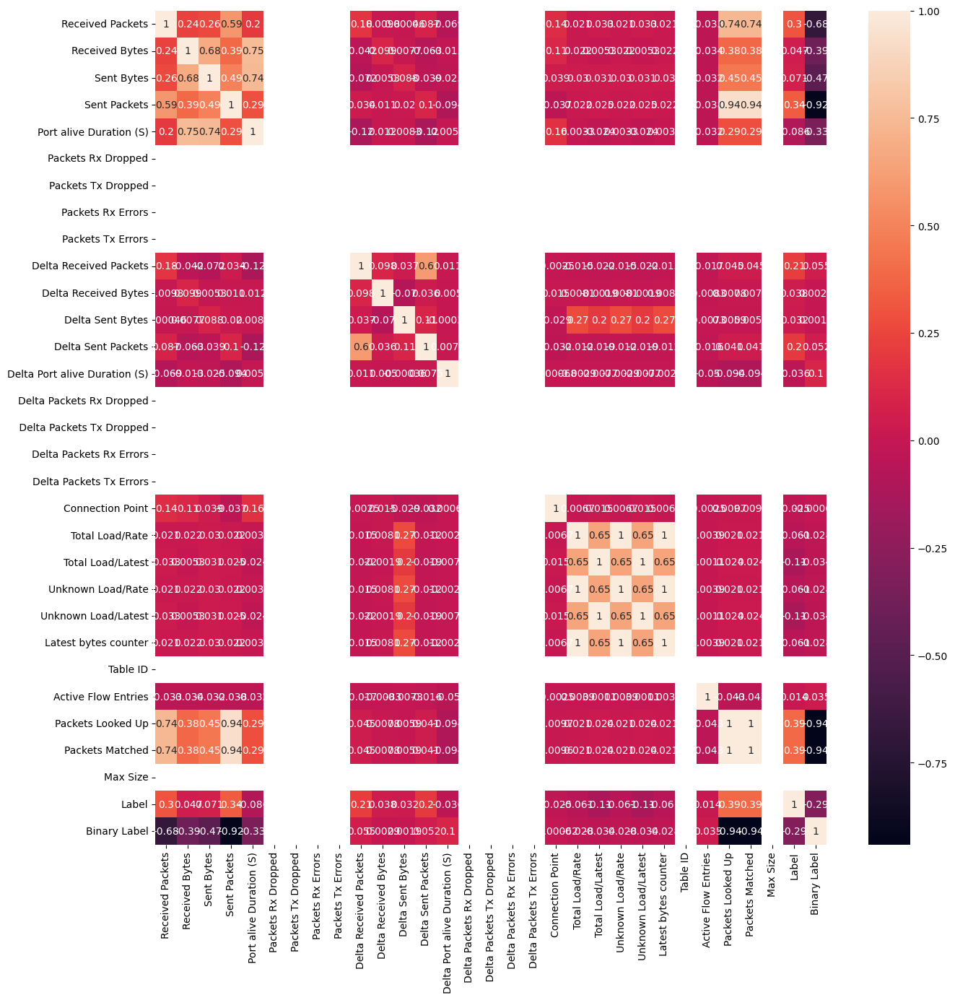

In [53]:
plt.figure(figsize=(15,15))
sns.heatmap(dataset.corr(), annot=True)
plt.show()

**Feature Scaling**

Feature Scaling is the process of normalizing or standardizing numerical features so that they have a consistent range or distribution.

Here, we use **Standardization**

Standardization is a very effective technique which re-scale a feature value so that it has distribution with 0 mean value and variance equals to 1


for multi class

In [54]:
X = dataset.drop('Label', axis=1)  # Features
y = dataset['Label']  # Labels


for binary  class

In [55]:
X_bin = dataset.drop('Label', axis=1)
y_bin = dataset['Binary Label']

multi scale

In [56]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [57]:
X_scaled

array([[-0.32914309, -0.71472595, -0.52911924, ..., -0.42573275,
         0.        ,  0.33491514],
       [-0.32830061, -0.54472096, -0.7121544 , ..., -0.42573275,
         0.        ,  0.33491514],
       [-0.32756535, -0.54453006, -0.71237775, ..., -0.42573275,
         0.        ,  0.33491514],
       ...,
       [-0.3152038 , -0.03304345, -0.48420095, ...,  0.82822942,
         0.        ,  0.33491514],
       [ 1.95138674, -0.32717907, -0.71175334, ...,  0.82822942,
         0.        ,  0.33491514],
       [-0.32767257, -0.71415356,  0.02168187, ...,  0.82822942,
         0.        ,  0.33491514]])

binary scale

In [ ]:
X_bin_scaled=scaler.fit_transform(X_bin)

In [ ]:
X_bin_scaled

array([[-0.32914309, -0.71472595, -0.52911924, ..., -0.42573275,
         0.        ,  0.33491514],
       [-0.32830061, -0.54472096, -0.7121544 , ..., -0.42573275,
         0.        ,  0.33491514],
       [-0.32756535, -0.54453006, -0.71237775, ..., -0.42573275,
         0.        ,  0.33491514],
       ...,
       [-0.3152038 , -0.03304345, -0.48420095, ...,  0.82822942,
         0.        ,  0.33491514],
       [ 1.95138674, -0.32717907, -0.71175334, ...,  0.82822942,
         0.        ,  0.33491514],
       [-0.32767257, -0.71415356,  0.02168187, ...,  0.82822942,
         0.        ,  0.33491514]])

**(B). Try Different Feature Selection Methods**

**Feature selection**

Feature Selection is the process of selecting the most relevant features (input variables) in a dataset while removing irrelevant or redundant ones.


1. ANOVA(Analysis of Variance)


In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from sklearn.feature_selection import f_classif

In [ ]:
f_values, p_values = f_classif(X_scaled, y)

In [ ]:
feature_scores = pd.DataFrame({'Feature': X.columns, 'F-value': f_values, 'p-value': p_values})

In [ ]:
feature_scores

,Feature,F-value,p-value
0,Received Packets,6.799332e+03,0.000000e+00
1,Received Bytes,4.720339e+03,0.000000e+00
2,Sent Bytes,5.306932e+03,0.000000e+00
3,Sent Packets,4.266730e+04,0.000000e+00
4,Port alive Duration (S),1.478128e+04,0.000000e+00
5,Packets Rx Dropped,NaN,NaN
6,Packets Tx Dropped,NaN,NaN
7,Packets Rx Errors,NaN,NaN
8,Packets Tx Errors,NaN,NaN
9,Delta Received Packets,5.774494e+02,0.000000e+00


In [ ]:
selected_anova_multi = feature_scores[feature_scores['p-value'] < 0.05]['Feature']

In [ ]:
selected_anova_multi

,Feature
0,Received Packets
1,Received Bytes
2,Sent Bytes
3,Sent Packets
4,Port alive Duration (S)
9,Delta Received Packets
10,Delta Received Bytes
11,Delta Sent Bytes
12,Delta Sent Packets
13,Delta Port alive Duration (S)


In [ ]:
f_values, p_values = f_classif(X_bin_scaled, y_bin)

In [ ]:
feature_scores_bin = pd.DataFrame({'Feature': X_bin.columns, 'F-value': f_values, 'p-value': p_values})

In [ ]:
feature_scores_bin

,Feature,F-value,p-value
0,Received Packets,3.229516e+04,0.000000e+00
1,Received Bytes,6.897774e+03,0.000000e+00
2,Sent Bytes,1.079570e+04,0.000000e+00
3,Sent Packets,2.044961e+05,0.000000e+00
4,Port alive Duration (S),4.626861e+03,0.000000e+00
5,Packets Rx Dropped,NaN,NaN
6,Packets Tx Dropped,NaN,NaN
7,Packets Rx Errors,NaN,NaN
8,Packets Tx Errors,NaN,NaN
9,Delta Received Packets,1.126146e+02,2.856356e-26


In [ ]:
selected_anova_bin = feature_scores[feature_scores['p-value'] < 0.05]['Feature']

In [ ]:
selected_anova_bin

,Feature
0,Received Packets
1,Received Bytes
2,Sent Bytes
3,Sent Packets
4,Port alive Duration (S)
9,Delta Received Packets
10,Delta Received Bytes
11,Delta Sent Bytes
12,Delta Sent Packets
13,Delta Port alive Duration (S)


2. PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=0.95)

In [ ]:
X_pca_mul = pca.fit_transform(X_scaled)

In [ ]:
print(f"Original number of features: {X.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_mul.shape[1]}")

Original number of features: 30
Reduced number of features after PCA: 11


In [ ]:
X_pca_bin = pca.fit_transform(X_bin_scaled)

In [ ]:
print(f"Original number of features: {X_bin.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_bin.shape[1]}")

Original number of features: 30
Reduced number of features after PCA: 11


3. Mutual Information

In [ ]:
from sklearn.feature_selection import mutual_info_classif


# for multi class

mi = mutual_info_classif(X_scaled, y)


feature_scores_mi = pd.DataFrame({'Feature': X.columns, 'Mutual Information': mi})
print(feature_scores_mi)




top_features_mi = feature_scores_mi[feature_scores_mi['Mutual Information'] > 0.1]['Feature']
print("Top features selected by Mutual Information:", top_features_mi)


                          Feature  Mutual Information
0                Received Packets            0.697947
1                  Received Bytes            0.972201
2                      Sent Bytes            0.825346
3                    Sent Packets            0.701114
4         Port alive Duration (S)            1.146492
5              Packets Rx Dropped            0.001371
6              Packets Tx Dropped            0.004958
7               Packets Rx Errors            0.000000
8               Packets Tx Errors            0.000000
9          Delta Received Packets            0.170377
10           Delta Received Bytes            0.275466
11               Delta Sent Bytes            0.316330
12             Delta Sent Packets            0.172637
13  Delta Port alive Duration (S)            0.007071
14       Delta Packets Rx Dropped            0.000000
15       Delta Packets Tx Dropped            0.001295
16        Delta Packets Rx Errors            0.001096
17        Delta Packets Tx E

In [ ]:
#for binary
mi_bin = mutual_info_classif(X_bin_scaled, y_bin)


feature_scores_mi_bin = pd.DataFrame({'Feature': X_bin.columns, 'Mutual Information': mi_bin})
print(feature_scores_mi_bin)


top_features_mi_bin = feature_scores_mi_bin[feature_scores_mi_bin['Mutual Information'] > 0.1]['Feature']
print("Top features selected by Mutual Information:", top_features_mi_bin)

                          Feature  Mutual Information
0                Received Packets            0.251202
1                  Received Bytes            0.278117
2                      Sent Bytes            0.256080
3                    Sent Packets            0.322915
4         Port alive Duration (S)            0.276859
5              Packets Rx Dropped            0.005521
6              Packets Tx Dropped            0.000397
7               Packets Rx Errors            0.000732
8               Packets Tx Errors            0.000000
9          Delta Received Packets            0.013565
10           Delta Received Bytes            0.022766
11               Delta Sent Bytes            0.043972
12             Delta Sent Packets            0.012028
13  Delta Port alive Duration (S)            0.007262
14       Delta Packets Rx Dropped            0.000000
15       Delta Packets Tx Dropped            0.000000
16        Delta Packets Rx Errors            0.000000
17        Delta Packets Tx E

4.RFE

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [ ]:
model = LogisticRegression(max_iter=1000)

In [ ]:
rfe = RFE(model, n_features_to_select=5)

In [ ]:
X_rfe_mul = rfe.fit_transform(X_scaled, y)

In [ ]:
selected_features_rfe_mul = X.columns[rfe.support_]

In [ ]:
selected_features_rfe_mul

Index(['Port alive Duration (S)', 'Delta Received Packets',
       'Active Flow Entries', 'Packets Looked Up', 'Packets Matched'],
      dtype='object')

binary

In [ ]:
X_rfe_bin = rfe.fit_transform(X_bin_scaled, y_bin)

In [ ]:
selected_features_rfe_bin = X_bin.columns[rfe.support_]

In [ ]:
selected_features_rfe_bin

Index(['Sent Packets', 'Port alive Duration (S)', 'Packets Looked Up',
       'Packets Matched', 'Binary Label'],
      dtype='object')

In [ ]:
from sklearn.model_selection import train_test_split

**Splitting a dataset into training and testing sets**

for multiclass split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


for binary split

In [ ]:
X_train_bin_scaled, X_test_bin_scaled, y_train_bin_scaled, y_test_bin_scaled = train_test_split(X_bin_scaled, y_bin, test_size=0.2, random_state=42)

In [ ]:
print(set(y_train_bin_scaled))
print(set(y_test_bin_scaled))


{0, 1}
{0, 1}


In [ ]:
from sklearn.metrics import  classification_report

**Building models**

**Logistic regression**

Logistic regression predicts the output of a categorical dependent variable. Therefore the outcome must be a categorical or discrete value.

In [ ]:
from sklearn.linear_model import LogisticRegression

# for multiclass
from sklearn.multiclass import OneVsRestClassifier


logreg = OneVsRestClassifier(LogisticRegression())
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           1       0.61      0.94      0.74      1871
           2       0.73      0.75      0.74      1607
           3       0.68      0.55      0.61      1145
           4       1.00      0.22      0.36       197
           5       1.00      1.00      1.00       753
           6       0.88      0.57      0.69      1909

    accuracy                           0.73      7482
   macro avg       0.82      0.67      0.69      7482
weighted avg       0.77      0.73      0.72      7482



no overfitting

In [ ]:
logreg.score(X_train,y_train)*100
logreg.score(X_test,y_test)*100

73.25581395348837

In [ ]:

logreg_bin = LogisticRegression()
logreg_bin.fit(X_train_bin_scaled, y_train_bin_scaled)


y_pred_bin = logreg_bin.predict(X_test_bin_scaled)


print("Binary Classification Report for logistic regression:")
print(classification_report(y_test_bin_scaled , y_pred_bin))

Binary Classification Report for logistic regression:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       753
           1       1.00      1.00      1.00      6729

    accuracy                           1.00      7482
   macro avg       1.00      1.00      1.00      7482
weighted avg       1.00      1.00      1.00      7482



In [ ]:
logreg_bin.score(X_train_bin_scaled,y_train_bin_scaled)*100
logreg_bin.score(X_test_bin_scaled,y_test_bin_scaled)*100

100.0

**KNN**

K-Nearest Neighbors (KNN) is a supervised learning algorithm that classifies or predicts data based on the majority or average of its K nearest neighbors.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# KNN with selected features for multiclass
model_knn = KNeighborsClassifier(n_neighbors=3)
model_knn.fit(X_train, y_train)
y_pred_knn = model_knn.predict(X_test)

print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))


KNN Classification Report:
              precision    recall  f1-score   support

           1       0.76      0.82      0.79      1871
           2       0.93      0.88      0.91      1607
           3       0.89      0.89      0.89      1145
           4       0.59      0.35      0.43       197
           5       1.00      1.00      1.00       753
           6       0.80      0.80      0.80      1909

    accuracy                           0.85      7482
   macro avg       0.83      0.79      0.80      7482
weighted avg       0.85      0.85      0.84      7482



In [ ]:
model_knn.score(X_train,y_train)*100
model_knn.score(X_test,y_test)*100

84.58968190323442

In [ ]:
# KNN with selected features for binary class
model_knn_bin = KNeighborsClassifier(n_neighbors=5)
model_knn_bin.fit(X_train_bin_scaled, y_train_bin_scaled)
y_pred_knn_bin = model_knn_bin.predict(X_test_bin_scaled)

print("KNN Classification Report for binary classification:")
print(classification_report(y_test_bin_scaled, y_pred_knn_bin))

KNN Classification Report for binary classification:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       753
           1       1.00      1.00      1.00      6729

    accuracy                           1.00      7482
   macro avg       1.00      1.00      1.00      7482
weighted avg       1.00      1.00      1.00      7482



**Decision Tree**

A Decision Tree is a supervised learning algorithm that splits data into branches based on feature conditions, forming a tree-like structure for classification or regression.

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Decision Tree for multiclass
model_tree_multi = DecisionTreeClassifier(random_state=42)
model_tree_multi.fit(X_train, y_train)
y_pred_tree_multi = model_tree_multi.predict(X_test)

print("Classification Report for decision tree multiclass:")
print(classification_report(y_test, y_pred_tree_multi))


Classification Report for decision tree multiclass:
              precision    recall  f1-score   support

           1       0.87      0.86      0.87      1871
           2       0.95      0.96      0.95      1607
           3       0.95      0.94      0.95      1145
           4       0.72      0.66      0.69       197
           5       1.00      1.00      1.00       753
           6       0.88      0.88      0.88      1909

    accuracy                           0.91      7482
   macro avg       0.89      0.89      0.89      7482
weighted avg       0.91      0.91      0.91      7482



In [ ]:
# Decision Tree for binary class
model_tree_bin = DecisionTreeClassifier(random_state=42)
model_tree_bin.fit(X_train_bin_scaled, y_train_bin_scaled)
y_pred_tree_bin = model_tree_bin.predict(X_test_bin_scaled)

print("Classification Report for decision tree binary class:")
print(classification_report(y_test_bin_scaled, y_pred_tree_bin))


Classification Report for decision tree binary class:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       753
           1       1.00      1.00      1.00      6729

    accuracy                           1.00      7482
   macro avg       1.00      1.00      1.00      7482
weighted avg       1.00      1.00      1.00      7482



**Random Forest**

Random Forest is an ensemble learning algorithm that combines multiple decision trees

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Random Forest
model_rf = RandomForestClassifier(random_state=42)
model_rf.fit(X_train, y_train)
y_pred_rf = model_rf.predict(X_test)

print("Random Forest Classification Report for multiclass:")
print(classification_report(y_test, y_pred_rf))


Random Forest Classification Report for multiclass:
              precision    recall  f1-score   support

           1       0.89      0.92      0.91      1871
           2       0.98      0.97      0.98      1607
           3       0.99      0.96      0.97      1145
           4       0.97      0.70      0.81       197
           5       1.00      1.00      1.00       753
           6       0.90      0.92      0.91      1909

    accuracy                           0.94      7482
   macro avg       0.96      0.91      0.93      7482
weighted avg       0.94      0.94      0.94      7482



In [ ]:
# Random Forest for binary class
model_rf_bin = RandomForestClassifier(random_state=42)
model_rf_bin.fit(X_train_bin_scaled, y_train_bin_scaled)
y_pred_rf_bin = model_rf_bin.predict(X_test_bin_scaled)

print("Random Forest Classification Report for binary class:")
print(classification_report(y_test_bin_scaled, y_pred_rf_bin))


Random Forest Classification Report for binary class:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       753
           1       1.00      1.00      1.00      6729

    accuracy                           1.00      7482
   macro avg       1.00      1.00      1.00      7482
weighted avg       1.00      1.00      1.00      7482



**SVC**

Support Vector Classification (SVC) is a machine learning algorithm that finds the optimal hyperplane to separate data points into different classes with maximum margin.

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Support Vector Machine Classifier
model_svm = SVC(kernel='poly', C=10, gamma='scale', random_state=42 , degree=3)
model_svm.fit(X_train, y_train)
y_pred_svm = model_svm.predict(X_test)

print("SVM Classification Report for multiclass :")
print(classification_report(y_test, y_pred_svm))
model_svm.score(X_train,y_train)*100
model_svm.score(X_test,y_test)*100



SVM Classification Report for multiclass :
              precision    recall  f1-score   support

           1       0.59      0.97      0.73      1871
           2       0.82      0.82      0.82      1607
           3       0.82      0.69      0.75      1145
           4       0.92      0.23      0.37       197
           5       1.00      1.00      1.00       753
           6       0.94      0.53      0.68      1909

    accuracy                           0.76      7482
   macro avg       0.85      0.70      0.72      7482
weighted avg       0.82      0.76      0.76      7482



76.4367816091954

In [ ]:
model_svm.score(X_test,y_test)*100

76.4367816091954

In [ ]:
# Support Vector Machine Classifier for binary class
model_svm_bin = SVC(kernel='poly', C=10, gamma='scale', random_state=42 , degree=3)
model_svm_bin.fit(X_train_bin_scaled, y_train_bin_scaled)
y_pred_svm_bin = model_svm_bin.predict(X_test_bin_scaled)

print("SVM Classification Report for binaryclass :")
print(classification_report(y_test_bin_scaled, y_pred_svm_bin))

SVM Classification Report for multiclass :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       753
           1       1.00      1.00      1.00      6729

    accuracy                           1.00      7482
   macro avg       1.00      1.00      1.00      7482
weighted avg       1.00      1.00      1.00      7482



**Ensemble Learning**

 In an Ensemble Learning approach wecombine predictions of multiple models to get better predictive performance.

In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import VotingRegressor

**1. By Voting ensemble learning**

**for multi class**

Max Voting method is generally used for classification problems . In this the multiple models are used to make predictions for each data points .

Hard Voting: Predicts the class that receives the majority vote from multiple models (like a majority rule).



*with hard votingClassifier*

In [ ]:
li_multi_h = [
    ("dt1", DecisionTreeClassifier(max_depth=15, min_samples_split=5)),
    ("sv1", SVC()),
    ("rf1", RandomForestClassifier()),
    ("knn1", KNeighborsClassifier()),
    ("lg1", OneVsRestClassifier(LogisticRegression()))
]

In [ ]:
vc_multi_h=VotingClassifier(estimators=li_multi_h,voting="hard",  weights=[3, 3, 4, 2, 1] )

In [ ]:
vc_multi_h.fit(X_train,y_train)

VotingClassifier(estimators=[('dt1',
                              DecisionTreeClassifier(max_depth=15,
                                                     min_samples_split=5)),
                             ('sv1', SVC()), ('rf1', RandomForestClassifier()),
                             ('knn1', KNeighborsClassifier()),
                             ('lg1',
                              OneVsRestClassifier(estimator=LogisticRegression()))],
                 weights=[3, 3, 4, 2, 1])

with hard votingClassifier there is very less overfitting

In [ ]:
vc_multi_h.score(X_test,y_test)*100 ,vc_multi_h.score(X_train,y_train)*100

(91.40604116546378, 95.66626570435713)



---



Soft Voting: Averages the predicted probabilities from all models and selects the class with the highest probability.

*with soft VotingClassifier*

In [ ]:
li_multi = [
    ("dt1", DecisionTreeClassifier(max_depth=15, min_samples_split=5)),
    ("sv1", SVC(probability=True)),
    ("rf1", RandomForestClassifier()),
    ("knn1", KNeighborsClassifier()),
    ("lg1", OneVsRestClassifier(LogisticRegression()))
]


In [ ]:
vc_multi=VotingClassifier(estimators=li_multi,voting="soft",  weights=[3, 3, 4, 2, 1] )


In [ ]:
vc_multi.fit(X_train,y_train)

VotingClassifier(estimators=[('dt1',
                              DecisionTreeClassifier(max_depth=15,
                                                     min_samples_split=5)),
                             ('sv1', SVC(probability=True)),
                             ('rf1', RandomForestClassifier()),
                             ('knn1', KNeighborsClassifier()),
                             ('lg1',
                              OneVsRestClassifier(estimator=LogisticRegression()))],
                 voting='soft', weights=[3, 3, 4, 2, 1])

by using soft votingClassifier there is more overfitting

In [ ]:
vc_multi.score(X_test,y_test)*100 ,vc_multi.score(X_train,y_train)*100

(90.99171344560278, 97.59088479016306)

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

cv_multi = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(vc_multi, X_train, y_train, cv=cv_multi)
print("Cross-validation accuracy for multi class:", scores.mean())


Cross-validation accuracy for multi class: 0.9072774932095804


In [ ]:
prd_multi = {
    "dt": y_pred_tree_multi,
    "sv": y_pred_svm,
    "rf": y_pred_rf,
    "knn":y_pred_knn ,
    "lg" :y_pred,
    "vc": vc_multi.predict(X_test)
}


In [ ]:
pd.DataFrame(prd_multi)

,dt,sv,rf,knn,lg,vc
0,6,1,6,6,1,6
1,3,2,3,3,2,3
2,6,6,6,6,6,6
3,1,1,1,1,1,1
4,3,2,3,3,2,3
...,...,...,...,...,...,...
7477,1,1,1,6,1,1
7478,3,3,3,3,2,3
7479,6,6,6,6,6,6
7480,1,1,1,1,1,1


In [ ]:
from sklearn.metrics import accuracy_score

models = ["dt", "sv", "rf", "knn",  "lg", "vc"]
for model in models:
    print(f"{model} Accuracy: {accuracy_score(y_test, prd_multi[model]) * 100:.2f}%")


dt Accuracy: 91.05%
sv Accuracy: 76.44%
rf Accuracy: 94.03%
knn Accuracy: 84.59%
lg Accuracy: 73.26%
vc Accuracy: 90.99%


for binary class

In [ ]:
lib = [
    ("dt1", DecisionTreeClassifier()),
    ("sv1", SVC(probability=True)),
    ("rf1", RandomForestClassifier()),
    ("knn1", KNeighborsClassifier()),
    ("lg1", LogisticRegression())
]


In [ ]:
vc_bin=VotingClassifier(estimators=lib,voting="soft", weights=[3, 1, 4, 2, 1] )

In [ ]:
vc_bin.fit(X_train_bin_scaled,y_train_bin_scaled)

VotingClassifier(estimators=[('dt1', DecisionTreeClassifier()),
                             ('sv1', SVC(probability=True)),
                             ('rf1', RandomForestClassifier()),
                             ('knn1', KNeighborsClassifier()),
                             ('lg1', LogisticRegression())],
                 voting='soft', weights=[3, 1, 4, 2, 1])

In [ ]:
vc_bin.score(X_test_bin_scaled,y_test_bin_scaled)*100 ,vc_bin.score(X_train_bin_scaled,y_train_bin_scaled)*100

(100.0, 100.0)

In [ ]:
prd_bin = {
    "dt": y_pred_tree_bin,
    "sv": y_pred_svm_bin,
    "rf": y_pred_rf_bin,
    "knn":y_pred_knn_bin,
    "log": y_pred_bin,
    "vc": vc_bin.predict(X_test)
}


In [ ]:
pd.DataFrame(prd_bin)

,dt,sv,rf,knn,log,vc
0,1,1,1,1,1,1
1,1,1,1,1,1,1
2,1,1,1,1,1,1
3,1,1,1,1,1,1
4,1,1,1,1,1,1
...,...,...,...,...,...,...
7477,1,1,1,1,1,1
7478,1,1,1,1,1,1
7479,1,1,1,1,1,1
7480,1,1,1,1,1,1


**2.By using Stacking Ensemble learning**

Stacking ensemble learning is a technique that combines predictions from multiple base models using a meta-model (or meta-learner) to improve overall accuracy and generalization.

In [ ]:
from sklearn.ensemble import StackingClassifier

In [ ]:
base_models = [
    ("dt1", DecisionTreeClassifier(max_depth=15, min_samples_split=5)),
    ("sv1", SVC(probability=True)),
    ("rf1", RandomForestClassifier(n_estimators=100, random_state=42)),
    ("knn1", KNeighborsClassifier(n_neighbors=5)),
    ("lg1", OneVsRestClassifier(LogisticRegression()))
]

meta_model = RandomForestClassifier(n_estimators=50, max_depth=10, random_state=42)


stacking_model = StackingClassifier(estimators=base_models, final_estimator=meta_model)


stacking_model.fit(X_train, y_train)


stacking_accuracy = stacking_model.score(X_test, y_test)
print(f"Stacking Classifier Accuracy: {stacking_accuracy * 100:.2f}%")

Stacking Classifier Accuracy: 94.65%


In [ ]:
stacking_model.score(X_train,y_train)*100
stacking_model.score(X_test,y_test)*100

94.65383587276129

**Explainable AI (XAI) Analysis**

Explainable AI (XAI) refers to techniques and methods that make machine learning models transparent, interpretable, and understandable to humans, ensuring trust and accountability in AI decisions.

**By using Lime**

LIME (Local Interpretable Model-agnostic Explanations) is an XAI technique that explains individual predictions of any black-box model by approximating it with an interpretable model locally around the instance

In [ ]:
!pip install lime


**for multi class**

In [ ]:
import pandas as pd
import numpy as np
from lime.lime_tabular import LimeTabularExplainer


feature_names = [f'feature{i+1}' for i in range(30)]


X_train_df = pd.DataFrame(X_train, columns=feature_names)


explainer = LimeTabularExplainer(
    training_data=np.array(X_train_df),
    feature_names=feature_names,
    class_names=[1, 2, 3, 4, 5, 6],
    mode='classification'
)



In [ ]:
print(type(X_test))


<class 'numpy.ndarray'>


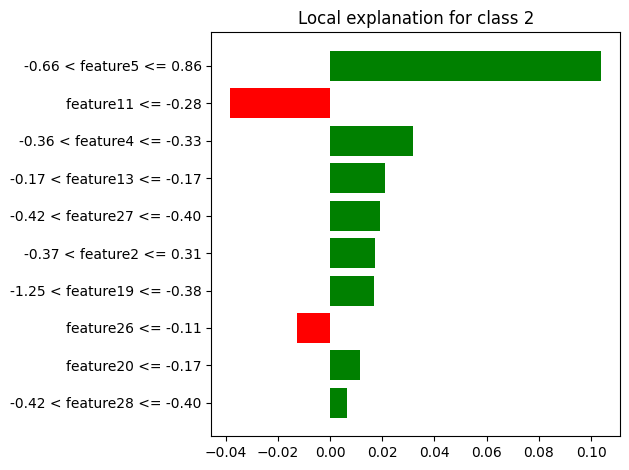

In [ ]:

X_test_df = pd.DataFrame(X_test, columns=feature_names)
exp1 = explainer.explain_instance(
    data_row=X_test_df.iloc[1],
    predict_fn=stacking_model.predict_proba
)

exp1.show_in_notebook()

#Plot local explanation
plt = exp1.as_pyplot_figure()
plt.tight_layout()
exp1.show_in_notebook(show_table=True)


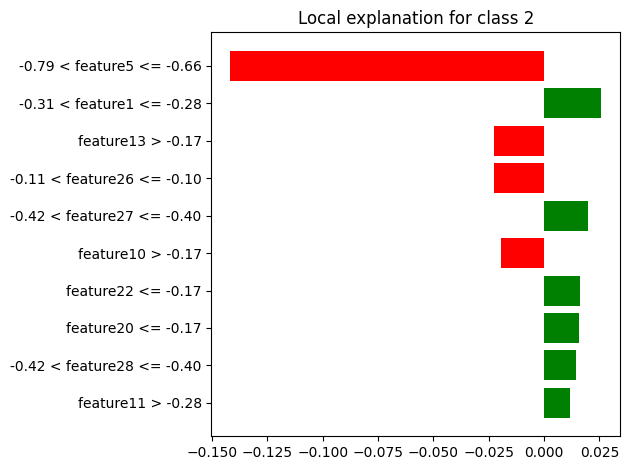

In [ ]:

exp2 = explainer.explain_instance(
    data_row=X_test_df.iloc[100],
    predict_fn=stacking_model.predict_proba
)

exp2.show_in_notebook()

#Plot local explanation
plt = exp2.as_pyplot_figure()
plt.tight_layout()
exp2.show_in_notebook(show_table=True)

**for binary class**

In [ ]:
feature_names = [f'feature{i+1}' for i in range(30)]


X_train_bin = pd.DataFrame(X_train_bin_scaled, columns=feature_names)


explainer = LimeTabularExplainer(
    training_data=np.array(X_train_bin),
    feature_names=feature_names,
    class_names=[0,1],
    mode='classification'
)

In [ ]:
print(type(X_test_bin_scaled))

<class 'numpy.ndarray'>


In [ ]:
X_test_bin = pd.DataFrame(X_test_bin_scaled, columns=feature_names)
exp = explainer.explain_instance(
    data_row=X_test_bin.iloc[1],
    predict_fn=vc_bin.predict_proba
)

exp.show_in_notebook()

In [ ]:
exp = explainer.explain_instance(
    data_row=X_test_df.iloc[100],
    predict_fn=vc_bin.predict_proba
)

exp.show_in_notebook()

In [ ]:
!pip install shap

In [ ]:
import shap

In [ ]:

explainer = shap.KernelExplainer(stacking_model.predict_proba, shap.sample(X_train, 100))


shap_values = explainer.shap_values(X_test)


shap.summary_plot(shap_values, X_test)


**Scalability and Throughput Testing**

Scalability and throughput testing evaluate each model's performance by measuring time, resource utilization, and efficiency across different feature selection methods during training and inference.

In [ ]:
dataset_sizes = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,0.8,0.9]  # 10%, 25%, 50%, etc.
training_times = []
accuracies = []

In [ ]:
import time

In [ ]:
for size in dataset_sizes:
    x_trainsub, X_testsub, y_trainsub, Y_testsub = train_test_split(X_scaled,y, train_size=size, random_state=42)

    # X_train, Y_train = smt.fit_resample(x_trainsub, y_trainsub)
    # Train the model


    start_time = time.time()
    stacking_model.fit(x_trainsub, y_trainsub)
    training_time = time.time() - start_time
    training_times.append(training_time)

    # Test on full test set
    y_pred = stacking_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print (accuracy)
    accuracies.append(accuracy)

0.8707564822240043
0.9039026998128843
0.9133921411387329
0.9282277465918204
0.9327719860999732
0.9395883453622026
0.9407912322908313
0.9464047046244319
0.975006682705159


In [ ]:
for size, time_taken, acc in zip(dataset_sizes, training_times, accuracies):
    print(f"Training size: {size*100}%, Time: {time_taken:.2f}s, Test Accuracy: {acc}")

Training size: 10.0%, Time: 27.90s, Test Accuracy: 0.8707564822240043
Training size: 20.0%, Time: 75.31s, Test Accuracy: 0.9039026998128843
Training size: 30.0%, Time: 133.77s, Test Accuracy: 0.9133921411387329
Training size: 40.0%, Time: 225.85s, Test Accuracy: 0.9282277465918204
Training size: 50.0%, Time: 347.10s, Test Accuracy: 0.9327719860999732
Training size: 60.0%, Time: 481.77s, Test Accuracy: 0.9395883453622026
Training size: 70.0%, Time: 648.34s, Test Accuracy: 0.9407912322908313
Training size: 80.0%, Time: 833.07s, Test Accuracy: 0.9464047046244319
Training size: 90.0%, Time: 1088.63s, Test Accuracy: 0.975006682705159


In [ ]:
import matplotlib.pyplot as plt

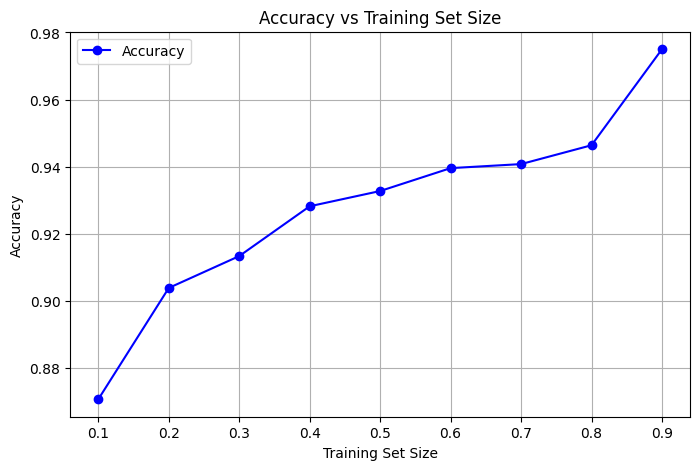

In [ ]:
# Plot accuracy vs. training set size
plt.figure(figsize=(8, 5))
plt.plot(dataset_sizes, accuracies, marker='o', linestyle='-', color='b', label='Accuracy')

plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Training Set Size")
plt.grid(True)
plt.legend()
plt.show()